# How to analyze a large protein landscape (GB1)

In the previous tutorial, we have seen how to create a series of plots for the simple serine landscape consisting of only 64 genotypes. In that case, we knew beforehand the qualitative properties of the landscape, and used this knowledge to show how these properties were reflected on the visualization.

However, we will usually do the reverse process, this is, visualize an unknown landscape to understand its geometry and its main qualitative features. In the following tutorial, we will use experimental data from [GB1 protein binding to its target](https://doi.org/10.7554/eLife.16965) that [we previously analyzed](https://doi.org/10.1038/s41467-020-15512-5). We will show how to visualize the inferred genotype-phenotype map and explore the different regions of functional sequences in a few lines of python code.


In [1]:
# Import required libraries
import numpy as np
import holoviews as hv
import matplotlib.pyplot as plt

import gpmap.plot.mpl as mplot
import gpmap.plot.ply as pplot
import gpmap.plot.ds as dplot

from gpmap.space import SequenceSpace
from gpmap.randwalk import WMWalk
from gpmap.datasets import DataSet
from gpmap.genotypes import select_genotypes

Our library includes a small set of processed datasets that we have thoroughly analyzed and will be using to illustrating the main functionality of the library. These datasets are accessible through the class ```DataSet```, which includes the experimental measurements (the mean `y` and variance `y_var`) for the observed set of genotypes accessible through the ```data``` attribute. 

In [2]:
dataset = DataSet('gb1')
dataset.data.head()

,y,y_var
sequence,,
AAAA,0.460831,0.046009
AAAG,-2.192261,0.255906
AAAH,-4.728306,2.064530
AAAI,-4.338842,2.095252
AAAL,-2.326240,0.087518


It also includes the inferred full combinatorial landscape through ```landscape``` attribute, this is, the estimated Maximum a Posteriori (MAP) for every possible sequence in the landscape, in this particular case, using Variance Component regression (see Inference section for more information).

In [3]:
dataset.landscape.head()

,y
seq,
AAAA,0.296301
AAAC,-2.713474
AAAD,-2.912992
AAAE,-4.548719
AAAF,-3.276738


Finally, it also provides a direct method to build the ```SequenceSpace``` for this particular dataset: ```DataSet.to_sequence_space()```

In [4]:
space = dataset.to_sequence_space()
print(space)

Sequence Space:
	Type: protein
	Sequence length: 4
	Number of alleles per site: [20, 20, 20, 20]
	Genotypes: [AAAA,AAAC,AAAD,...,YYYV,YYYW,YYYY]
	Function y: [0.30,-2.71,-2.91,...,-3.00,-4.72,-4.88]


Alternatively and as with datasets that are not provided as a dataset in the library, one can build the ```SequenceSpace``` directly from the sequence-function estimates.

In [5]:
space = SequenceSpace(X=dataset.landscape.index.values,
                      y=dataset.landscape.y.values)
print(space)

Sequence Space:
	Type: protein
	Sequence length: 4
	Number of alleles per site: [20, 20, 20, 20]
	Genotypes: [AAAA,AAAC,AAAD,...,YYYV,YYYW,YYYY]
	Function y: [0.30,-2.71,-2.91,...,-3.00,-4.72,-4.88]


##  Calculating the coordinates of the visualization

Once we have defined the `SequenceSpace`, we can define the evolutionary random walk and calculate the coordinates of the visualization.

In [6]:
rw = WMWalk(space)

In this particular case, the measurements are relative to the wild-type sequence, and this the function associated to the WT sequence is 0. Thus, it is reasonable to set a mean function at stationarity of 0 to define the strength of selection for the visualization.

In [8]:
rw.calc_visualization(mean_function=0, n_components=20)
nodes_df, edges_df = rw.nodes_df, rw.space.get_edges_df()

## Exploring the relaxation times associated to the Diffusion axes

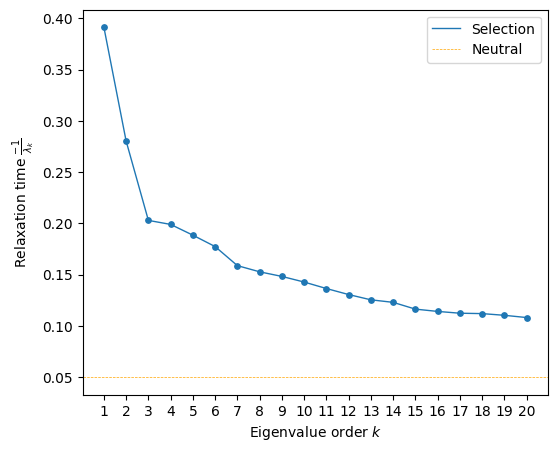

In [9]:
fig, axes = plt.subplots(1, 1, figsize=(6, 5))
mplot.plot_relaxation_times(rw.decay_rates_df, axes, neutral_time=1/20.)

We can clearly see that the relaxation times associated the first 2 components are substantially higher than the rest, suggesting that they should retain the most relevant features of the landscape. Still, faster decaying components decay substantially slower than expectation at neutrality, possibly retaining other secondary sequence features.

## Visualizing the GB1 landscape

When working with large genotype-phenotype maps such as this, rendering the edges becomes the limiting step while plotting. Thus, for fast exploration of the genotype-phenotype map, it is sometimes useful to skip plotting them in the first place by not setting the `edges_df` argument e.g. when choosing which axes to represent or exploring a range of selection strengths.

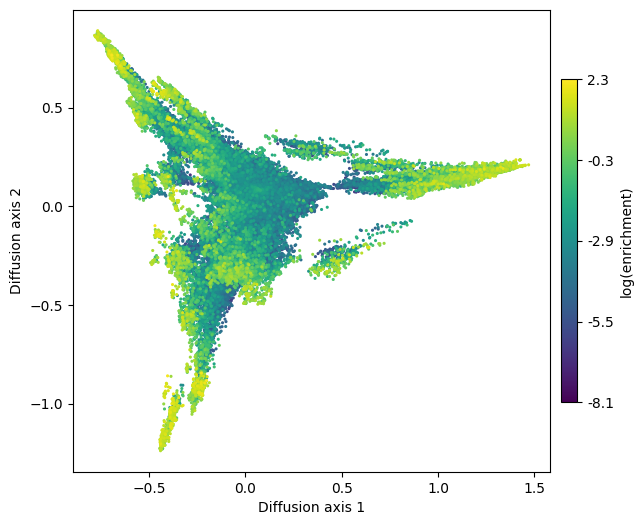

In [10]:
fig, axes = plt.subplots(1, 1, figsize=(7, 6))
mplot.plot_visualization(axes, nodes_df, nodes_size=5,
                        nodes_cmap_label='log(enrichment)')

This low dimensional representation shows that the landscape has 3 main high fitness regions. They appear separated from each other because it would take a long time to evolve from one another under selection for high binding affinity. Now that we have obtained a useful visualization, we can add the edges to have a better idea about the direct connectivity among the relevant genotypes.

> **Note** the rendering time of the genotypes alone increase from about 1s to ~1min when including rendering the edges as well. 

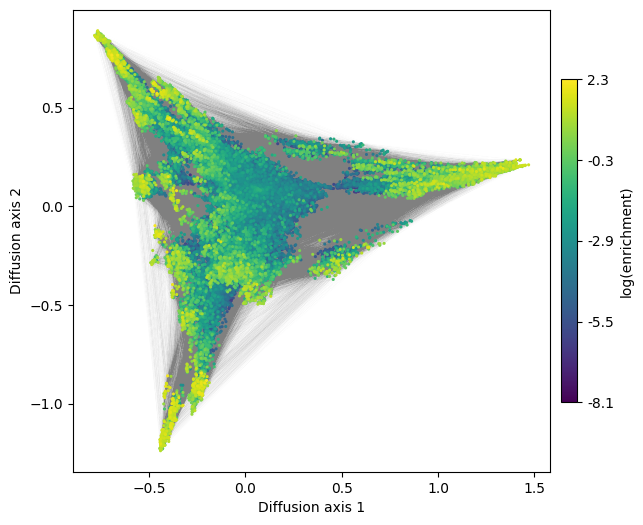

In [11]:
fig, axes = plt.subplots(1, 1, figsize=(7, 6))
mplot.plot_visualization(axes, nodes_df, edges_df=edges_df,
                        edges_alpha=0.005,  nodes_size=5,
                        nodes_cmap_label='log(enrichment)')

We can also generate 3D interactive plots. In order to have a fluent interaction, however, we may want to keep only high fitness sequences (using `select_genotypes` function) and/or show only the nodes.
Note also that edges and nodes can be hidden by clicking on their labels on the right panel

In [12]:
genotypes = nodes_df.index[nodes_df['function'] > -0.01]
ndf, edf = select_genotypes(nodes_df, genotypes, edges=edges_df)

In [13]:
pplot.plot_visualization(ndf, edges_df=edf, z='3',
                         nodes_cmap_label='log(enrichment)')

# How to characterize a complex landscape

Once we have a very general understanding of the main high function regions in the landscape, we generally want to know what are their main sequence determinants. 

One approach to do so is to highlight the alleles at each site in the visualization using the previously shown `figure_allele_grid` function. While this is useful when the number of alleles is low e.g. nucleotides, in the large number of possible aminoacids that compose protein space makes the plot harder to read. An alternative approach is to roughly select genotypes belonging to each of the peaks and plot their site-frequency sequence logos using [logomaker](https://logomaker.readthedocs.io/en/latest/).

The module `genotypes` contains a number of utilities to more easily handle the objects required for plotting and exploring the visualizations. In this case, we will be using `get_genotypes_from_region` to easily select the genotypes from the different highly functional regions in the landscape


In [14]:
import logomaker as lm

from gpmap.genotypes import get_genotypes_from_region

In [15]:
positions_labels = ['39', '40', '41', '54']

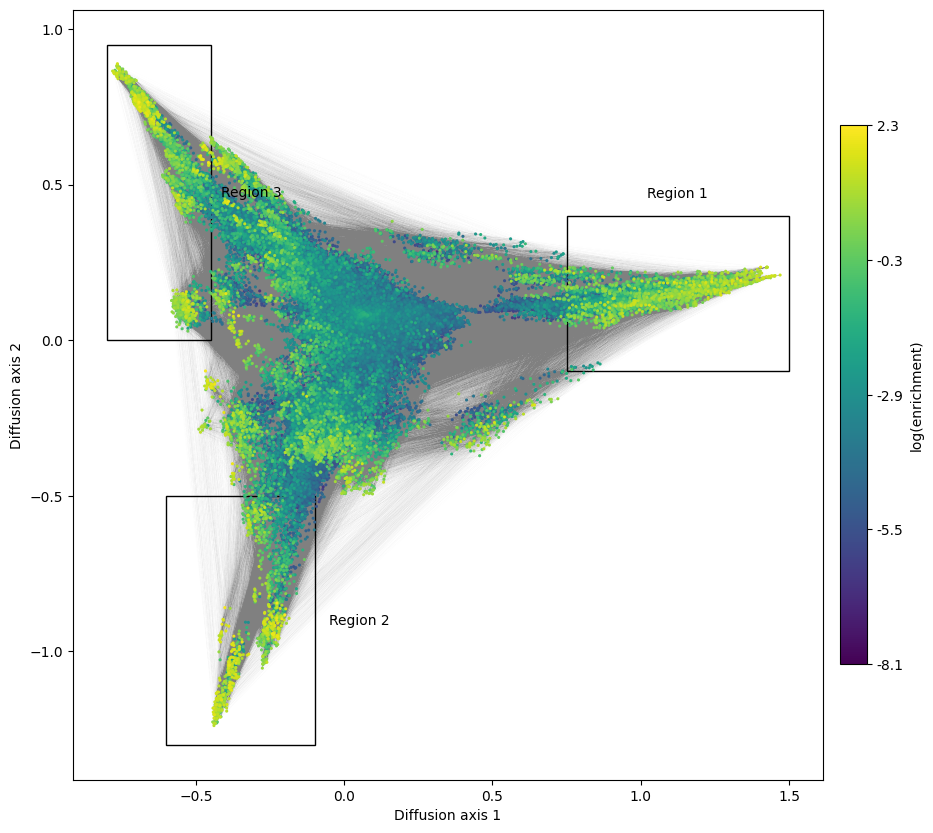

In [16]:
fig, axes = plt.subplots(1, 1, figsize=(11, 10))
mplot.plot_visualization(axes, nodes_df, edges_df=edges_df,
                         edges_alpha=0.005, nodes_size=5,
                         nodes_cmap_label='log(enrichment)')

boxes = [[(0.75, 1.5), (-0.1, 0.4)],
         [(-0.6, -0.1), (-1.3, -0.5)],
         [(-0.8, -0.45), (0, 0.95)]]

for i, (xlims, ylims) in enumerate(boxes):
    mplot.plot_genotypes_box(axes, xlims, ylims, title='Region {}'.format(i+1),
                             title_pos='top' if i == 0 else 'right')

Then, we can use `logomaker`  utilities to generate a site-frequency logo for each of the regions

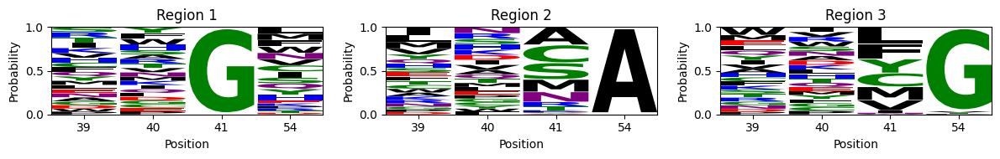

In [17]:
peak_seqs = [get_genotypes_from_region(nodes_df, min_values={'1': xs[0], '2': ys[0]},
                                       max_values={'1': xs[1], '2': ys[1]})
             for xs, ys in boxes]

fig, subplots = plt.subplots(1, 3, figsize=(12, 2))
for i, (seqs, axes) in enumerate(zip(peak_seqs, subplots)):
    m = lm.alignment_to_matrix(seqs.values, to_type='probability', pseudocount=0)
    m.index = np.arange(m.shape[0])
    logo = lm.Logo(m, ax=axes, color_scheme='chemistry', vpad=0.05)
    axes.set(ylabel='Probability', xlabel='Position',
                     xticks=np.arange(m.shape[0]), 
                     xticklabels=positions_labels, title='Region {}'.format(i+1))
fig.tight_layout()

This shows, not only that the first two positions barely contribute to the binding affinity in this assay, but also what are the sequence requirements at the last 2 positions for each region. 
- The largest region is characterized by XXGX, grouping nearly 1/20 of all the possible sequences and leading to the large cluster of sequences at the right hand side of the visualization. While there is a slight preference for MLF at position 54, accounting for about 20% of the sequences in the peak, we can also observe almost any other aminoacid in this set of functional sequences. 
- The other two peaks, on the other hand, are characterized by a strong requirement for a specific amoniacid at position 54, and the possibility of 2 largely distinct sets aminoacids at 41:
    - Region 2 requires A at 54 and C, A, S or M at 41
    - Region 3 requires G at 54 and F, L, Y or M at 41
    
## How to characterize intermediates

Besides the 3 main regions, we can observe some clusters of sequences that connect them with each other. These could serve as most common intermediates to evolve from one solution to another and illustrate the restricted order in which mutations can happen while maintaining high fitness. Thus, it is also interesting to study the sequence determinants of those intermediates to determine which allelic combinations are functional and which are the incompatibilities between the the different sets of functional sequences

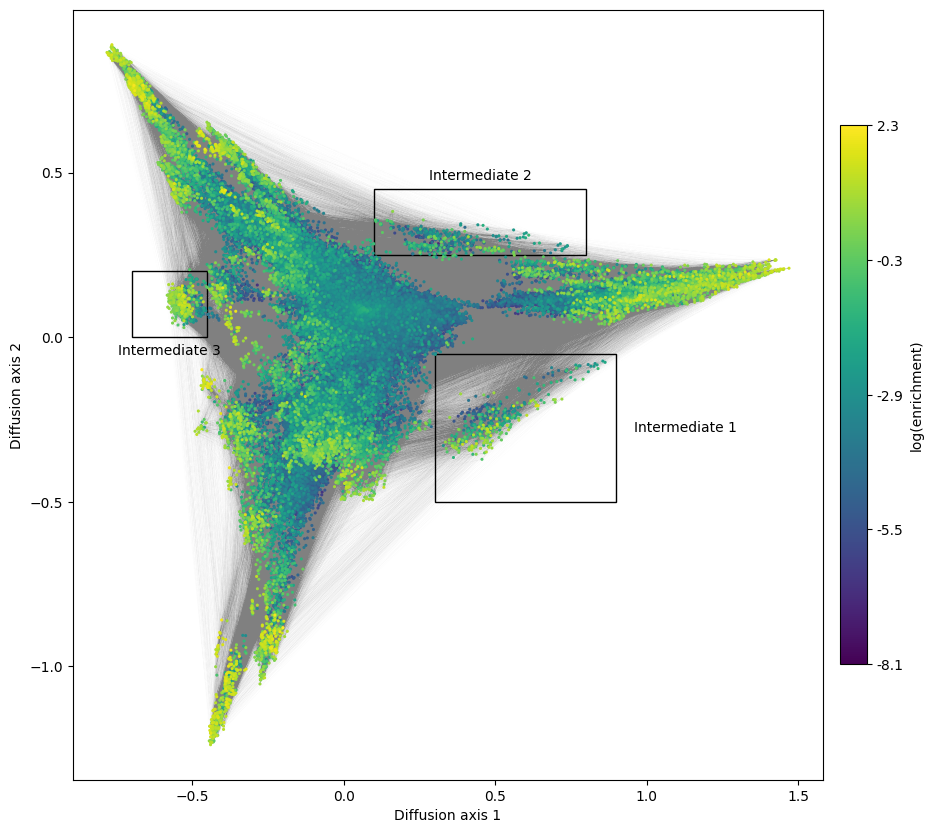

In [18]:
fig, axes = plt.subplots(1, 1, figsize=(11, 10))
mplot.plot_visualization(axes, nodes_df, edges_df=edges_df,
                        edges_alpha=0.005, nodes_size=5,
                        nodes_cmap_label='log(enrichment)')

boxes = [[(0.30, 0.9), (-0.5, -0.05), 'right'],
         [(0.1, 0.8), (0.25, 0.45), 'top'],
         [(-0.7, -0.45), (0, 0.2), 'bottom']]

for i, (xlims, ylims, pos) in enumerate(boxes):
    mplot.plot_genotypes_box(axes, xlims, ylims,
                             title='Intermediate {}'.format(i+1),
                             title_pos=pos)



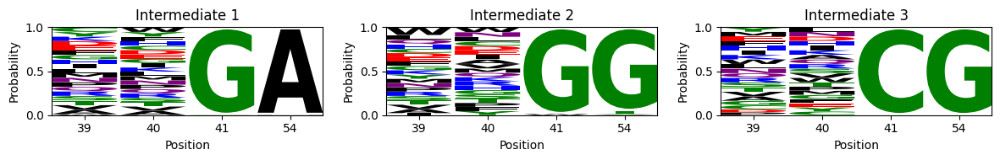

In [19]:
intermediates = [get_genotypes_from_region(nodes_df,
                                           min_values={'1': xs[0], '2': ys[0]},
                                           max_values={'1': xs[1], '2': ys[1]})
                 for xs, ys, _ in boxes]
    
    
fig, subplots = plt.subplots(1, len(intermediates), figsize=(12, 2))

for i, (seqs, axes) in enumerate(zip(intermediates, subplots)):
    m = lm.alignment_to_matrix(seqs.values, to_type='probability', pseudocount=0)
    m.index = np.arange(m.shape[0])
    logo = lm.Logo(m, ax=axes, color_scheme='chemistry', vpad=0.05)
    axes.set(ylabel='Probability', xlabel='Position',
                     xticks=np.arange(m.shape[0]), 
                     xticklabels=positions_labels, title='Intermediate {}'.format(i+1))
fig.tight_layout()

We can see that transitions from Region 1 to regions 2 and 3 are very natural: since Region 1 is not constained at positoin 54, it can easily evolve requirements from region 2 or 3 at position 54 without loss of fitness: XXGA and XXGG. The functional transitions are completed when mutating 41G to any of the compatible alleles at that position for each region. Likewise, regions 2 and 3 are connected to each other through the subset of compatible alleles at position 41, illustrated by the sequences XXCG in intermediate 3.

## Exploring more Diffusion axes

We can also look at more Diffusion axes explore finer details of the landscape that are not apparent from looking at only 2 dimensions. Remind that relaxation times are still substantially longer than expected under neutrality for more than 2 axes. Lets start by looking at Diffusion axis `3`

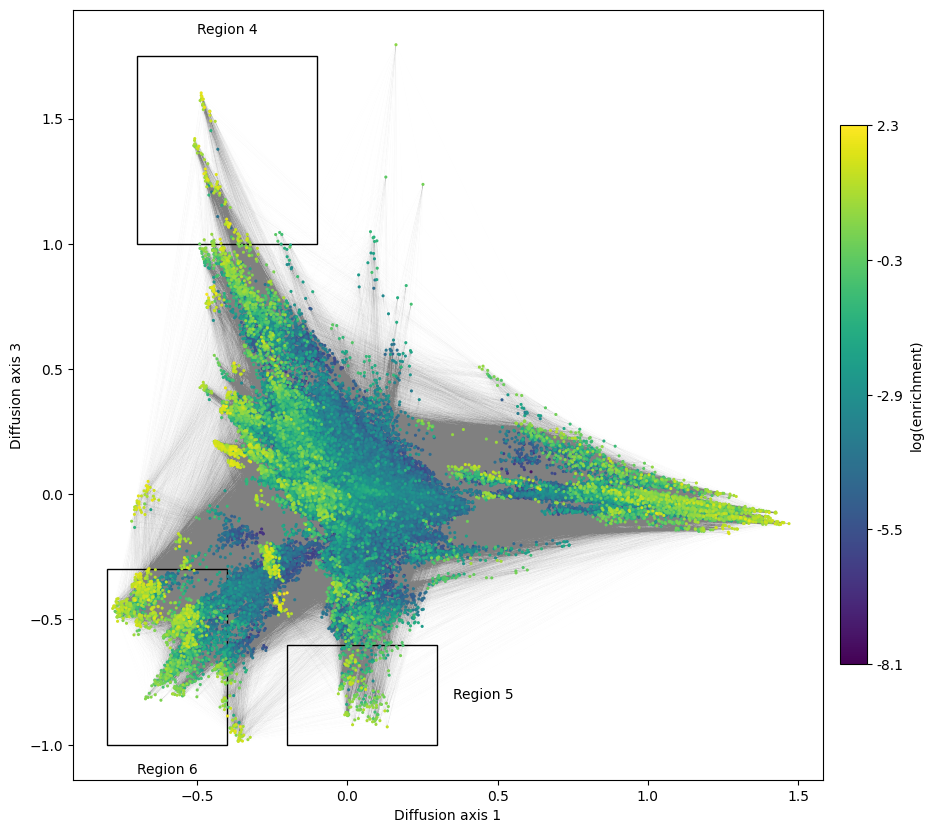

In [20]:
fig, axes = plt.subplots(1, 1, figsize=(11, 10))
mplot.plot_visualization(axes, nodes_df, edges_df=edges_df, y='3',
                         edges_alpha=0.005, nodes_size=5,
                         nodes_cmap_label='log(enrichment)')

boxes = [[(-0.70, -0.1), (1, 1.75), 'top'],
         [(-0.2, 0.3), (-1, -0.6), 'right'],
         [(-0.8, -0.4), (-1, -0.3), 'bottom']]

for i, (xlims, ylims, pos) in enumerate(boxes):
    mplot.plot_genotypes_box(axes, xlims, ylims,
                             title='Region {}'.format(i+4),
                             title_pos=pos)

We can see how Diffusion axis `3` now separates more strongly some regions in intermediate values at Diffusion axis `1`, generating a more or less continuous streak of high fitness sequences for which we can characterize both ends

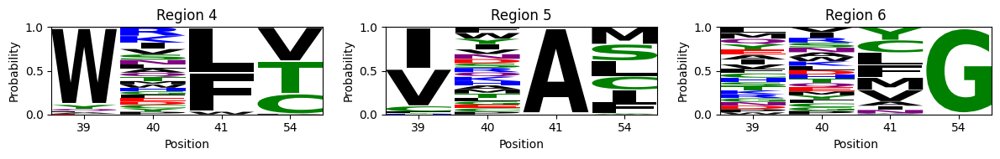

In [21]:
streak_seqs = [get_genotypes_from_region(nodes_df,
                                         min_values={'1': xs[0], '3': ys[0]},
                                         max_values={'1': xs[1], '3': ys[1]})
               for xs, ys, _ in boxes]

fig, subplots = plt.subplots(1, len(streak_seqs), figsize=(12, 2))

for i, (seqs, axes) in enumerate(zip(streak_seqs, subplots)):
    m = lm.alignment_to_matrix(seqs.values, to_type='probability', pseudocount=0)
    m.index = np.arange(m.shape[0])
    logo = lm.Logo(m, ax=axes, color_scheme='chemistry', vpad=0.05)
    axes.set(ylabel='Probability', xlabel='Position',
             xticks=np.arange(m.shape[0]), xticklabels=positions_labels,
             title='Region {}'.format(i+4))
fig.tight_layout()

- We can see that the top of the streak is characterized by a W at position 39, F/L at 41 and V, T or C at 54, while positipn 40 seems to be unrestricted. 
- The bottom of the streak is remakably different, characterized by I/V at position 39 and A at 41, while only allowing a subset of aminoacids at 54: M, S, L, C, I, F

## How to efficiently plot large fitness landscapes

One inherent difficulty that we face when dealing with complete fitness landscape is that the number of possible genotypes grows exponentially with sequence length. Decoupling the calculation of the embedding coordinate from the plots is certainly useful to either paralellize the calculations e.g. under different population sizes, or to allow efficient exploration of the landscape once the coordinates are known.

However, as the number of nodes and edges grows, rendering so many elements in a single picture starts to become limiting using standard plotting libraries like matplotlib. We can address these limitations using specialized libraries in visualization of large datasets like [datashader](https://datashader.org/), which are optimized to precalculate a bitmap to obtain a substantial increase in performance.

Lets see how long it took to render the landscape above and compare it to the implementation using [datashader](https://datashader.org/):

CPU times: user 20.8 s, sys: 1.07 s, total: 21.9 s
Wall time: 21.9 s


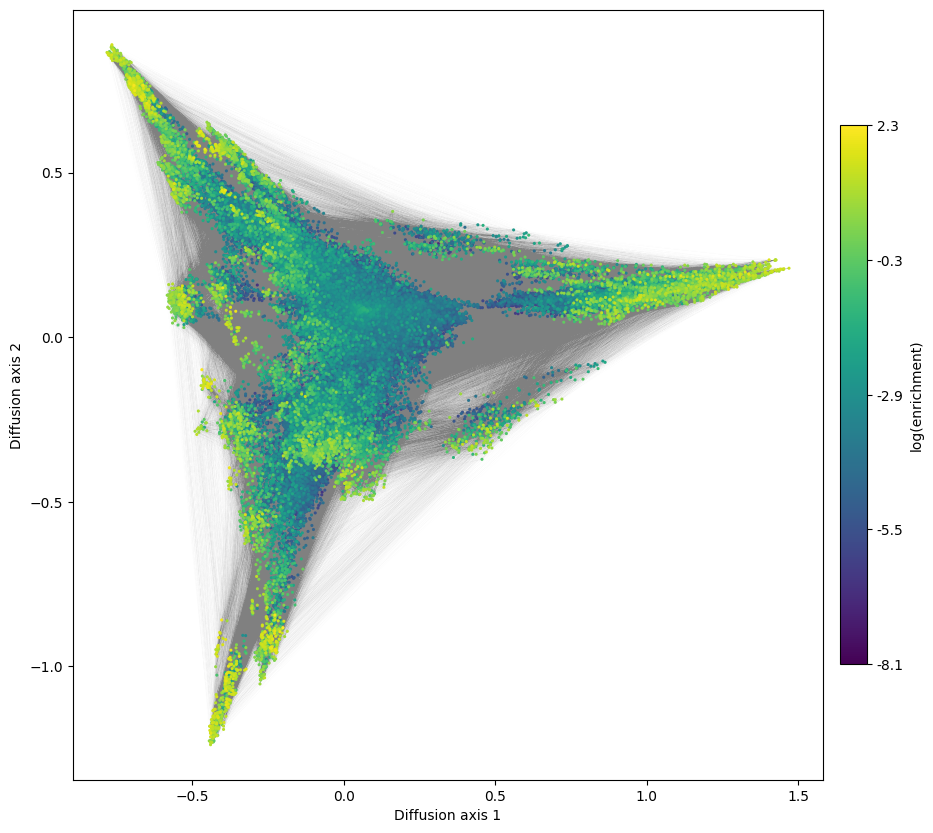

In [22]:
%%time
fig, axes = plt.subplots(1, 1, figsize=(11, 10))
mplot.plot_visualization(axes, nodes_df, edges_df=edges_df,
                         edges_alpha=0.005, nodes_size=5,
                         nodes_cmap_label='log(enrichment)')

CPU times: user 6.5 s, sys: 1.57 s, total: 8.06 s
Wall time: 6.96 s


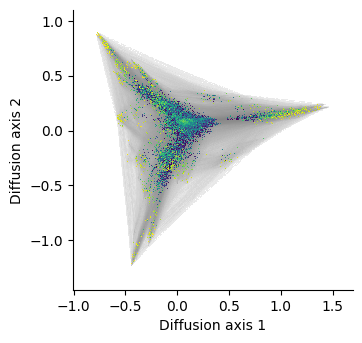

In [23]:
%%time
dsg = dplot.plot_visualization(nodes_df, edges_df=edges_df,
                               nodes_resolution=800, edges_resolution=800)
fig = hv.render(dsg)
fig

Once rendered, we can increase the size of the figure and plot anything on top using `matplotlib` functions

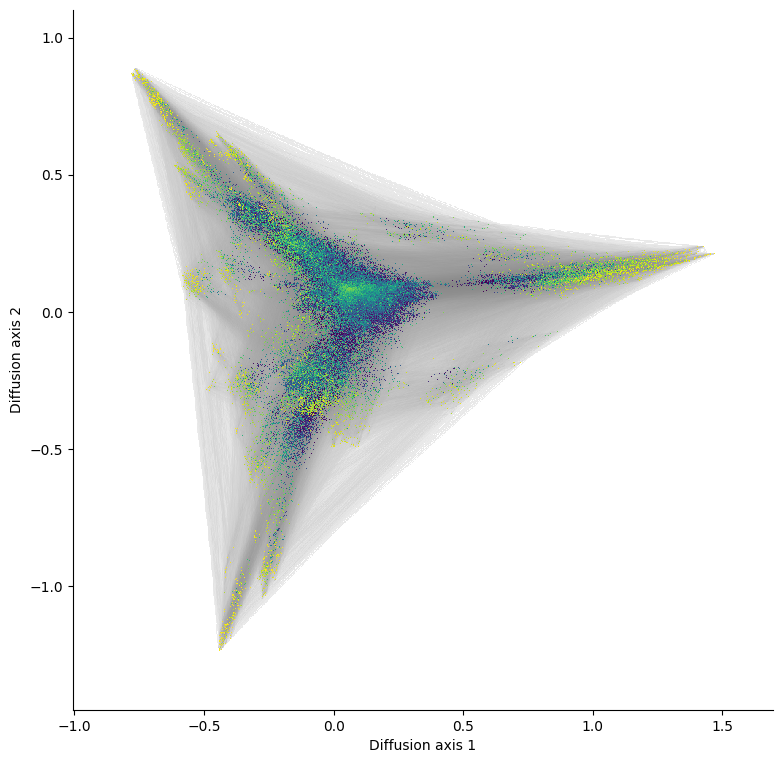

In [24]:
fig.set_size_inches(10, 10)
fig

We can see how the execution time has dramatically reduced by about 10 times and indeed becomes the only practical option once we want to visualize a landscape with over 1M genotypes. Another important feature is that we can decouple the rendering of the edges from the nodes, which allow us to process the allele grid plots much faster, since we only need to recalculate the bitmap for the genotypes and overlay them over the edges

Lets see a small example

In [25]:
%%time
edges_dsg = dplot.plot_edges(nodes_df, edges_df)

CPU times: user 1.6 s, sys: 631 ms, total: 2.23 s
Wall time: 2.24 s


In [26]:
%%time
nodes_dsg = dplot.plot_nodes(nodes_df)

CPU times: user 50.3 ms, sys: 4.94 ms, total: 55.2 ms
Wall time: 54.4 ms


We can clearly see that rendering the edges is the limiting step, so we can do it once for every plot we want to make with the same diffusion axes

CPU times: user 2.18 s, sys: 228 ms, total: 2.4 s
Wall time: 2.19 s


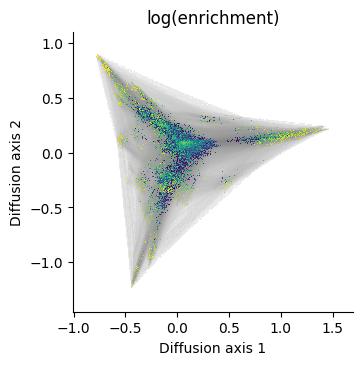

In [27]:
%%time
dsg = edges_dsg * nodes_dsg
dsg.opts(xlabel='Diffusion axis 1',
         ylabel='Diffusion axis 2',
         bgcolor='white', padding=0.1,
         title='log(enrichment)')
fig = hv.render(dsg)
fig

Lets say we now want to make a series of plots highlighting different quantitative information for each genotype or even a 3rd diffusion axis to have an idea of the 3D structure

CPU times: user 2.72 s, sys: 387 ms, total: 3.11 s
Wall time: 2.75 s


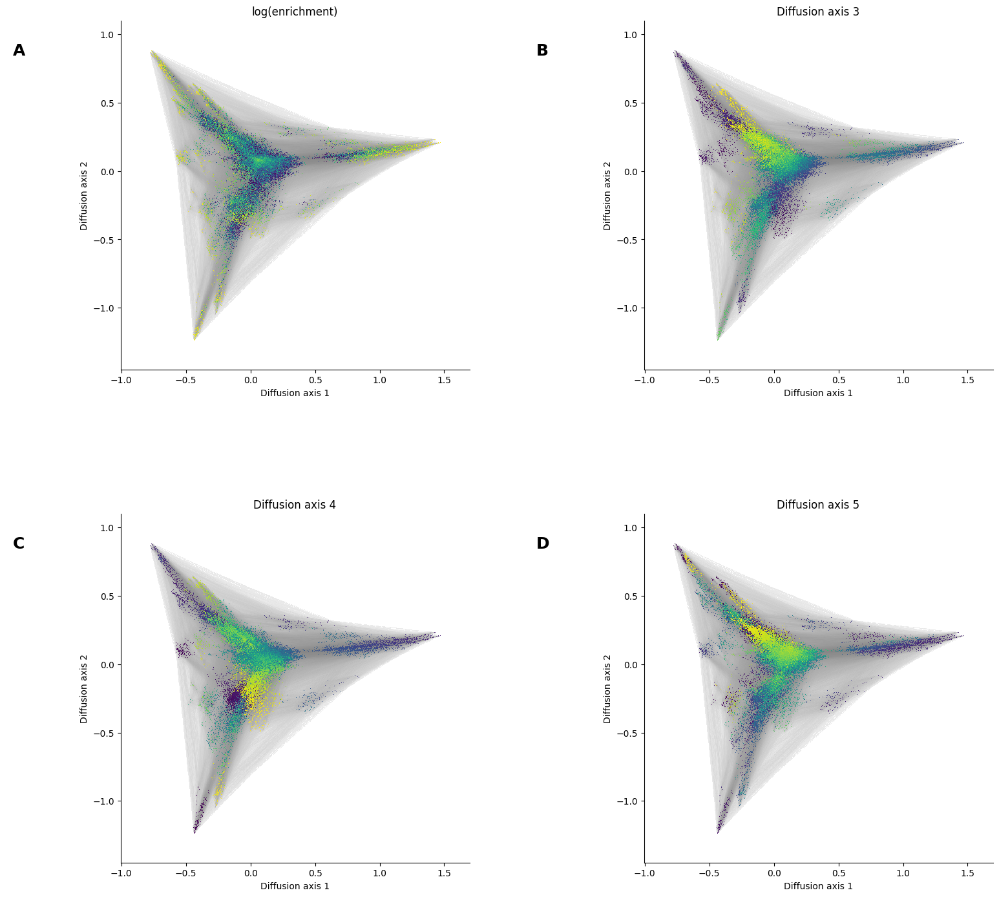

In [28]:
%%time
for axis in ['3', '4', '5']:
    nodes_dsg = dplot.plot_nodes(nodes_df, color=axis)
    panel = edges_dsg * nodes_dsg
    panel = panel.opts(xlabel='Diffusion axis 1',
                       ylabel='Diffusion axis 2',
                       bgcolor='white', padding=0.1,
                       title='Diffusion axis {}'.format(axis))
    dsg = dsg + panel
dsg.cols(2)
fig = hv.render(dsg)
fig.set_size_inches(15, 15)
fig